In [ ]:
!pip install bertviz

     |████████████████████████████████| 156 kB 2.8 MB/s 
     |████████████████████████████████| 1.2 MB 29.5 MB/s 
     |████████████████████████████████| 2.9 MB 38.4 MB/s 
     |████████████████████████████████| 131 kB 34.1 MB/s 
     |████████████████████████████████| 3.3 MB 36.4 MB/s 
     |████████████████████████████████| 895 kB 45.2 MB/s 
     |████████████████████████████████| 596 kB 59.3 MB/s 
     |████████████████████████████████| 56 kB 4.2 MB/s 
     |████████████████████████████████| 8.0 MB 39.6 MB/s 
     |████████████████████████████████| 79 kB 8.0 MB/s 
     |████████████████████████████████| 138 kB 50.5 MB/s 
     |████████████████████████████████| 127 kB 53.1 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
E

In [ ]:
from bertviz import head_view
from transformers import BertTokenizer, BertForQuestionAnswering

In [ ]:
def show_head_view(model, tokenizer, sentence_a, sentence_b=None):
    inputs = tokenizer.encode_plus(sentence_a, sentence_b, return_tensors='pt', add_special_tokens=True)
    token_type_ids = inputs['token_type_ids']
    input_ids = inputs['input_ids']
    attention = model(input_ids, token_type_ids=token_type_ids)[-1]
    input_id_list = input_ids[0].tolist() # Batch index 0
    tokens = tokenizer.convert_ids_to_tokens(input_id_list)
    if sentence_b:
        sentence_b_start = token_type_ids[0].tolist().index(1)
    else:
        sentence_b_start = None
    head_view(attention, tokens, sentence_b_start)

In [ ]:
model_version = 'bert-base-uncased'
do_lower_case = True
model = BertForQuestionAnswering.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
sentence_b = "India average annual GDP growth rate of 5.8% over the past two decades" #Context
sentence_a = "what is GDP growth rate of india?"   #question
show_head_view(model, tokenizer, sentence_a, sentence_b)

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/420M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForQuestionAnswering: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForQuestionAnswering were not initialized from the model checkpoint at bert-base-uncased a

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

<IPython.core.display.Javascript object>

In [ ]:
from transformers import BertTokenizer, BertForQuestionAnswering
from bertviz import model_view

# Load attention weights
model_version = 'bert-base-uncased'
do_lower_case = True
model = BertForQuestionAnswering.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
sentence_b = "India average annual GDP growth rate of 5.8% over the past two decades"
sentence_a = "what is GDP growth rate of india?"
inputs = tokenizer.encode_plus(sentence_a, sentence_b, return_tensors='pt', add_special_tokens=True)
token_type_ids = inputs['token_type_ids']
input_ids = inputs['input_ids']
attention = model(input_ids, token_type_ids=token_type_ids)[-1]
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer.convert_ids_to_tokens(input_id_list)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForQuestionAnswering: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForQuestionAnswering were not initialized from the model checkpoint at bert-base-uncased a

In [ ]:
model_view(attention, tokens)

<IPython.core.display.Javascript object>

In [ ]:
# from bertviz.transformers_neuron_view import BertForQuestionAnswering, BertTokenizer
# from bertviz.neuron_view import show

In [ ]:
# model_type = 'bert'
# model_version = 'bert-base-uncased'
# do_lower_case = True
# model = BertForQuestionAnswering.from_pretrained(model_version)
# tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
# sentence_b = "India average annual GDP growth rate of 5.8% over the past two decades"
# sentence_a = "what is GDP growth rate of india?"
# show(model, model_type, tokenizer, sentence_a, sentence_b, layer=2, head=0)

In [ ]:
!pip install allennlp==1.0.0 allennlp-models==1.0.0

     |████████████████████████████████| 473 kB 2.7 MB/s 
     |████████████████████████████████| 282 kB 24.3 MB/s 
     |████████████████████████████████| 124 kB 6.4 MB/s 
     |████████████████████████████████| 259 kB 45.7 MB/s 
     |███████████████████████████▎    | 643.0 MB 1.6 MB/s eta 0:01:08

## Please restart run time after running the above cell, otherwise it will run old versions

In [ ]:
from allennlp.predictors.predictor import Predictor

predictor = Predictor.from_path("https://storage.googleapis.com/allennlp-public-models/bidaf-model-2020.03.19.tar.gz")

In [ ]:
passage = """
Life expectancy in India is at 68 years, with life expectancy for women being 69.6 years and for men being 67.3. There are around 50 physicians per 100,000 Indians.[337] Migration from rural to urban areas has been an important dynamic in the recent history of India. The number of Indians living in urban areas grew by 31.2% between 1991 and 2001.[338] Yet, in 2001, over 70% still lived in rural areas.[339][340] The level of urbanisation increased further from 27.81% in the 2001 Census to 31.16% in the 2011 Census. The slowing down of the overall growth rate of population was due to the sharp decline in the growth rate in rural areas since 1991.[341] According to the 2011 census, there are 53 million-plus urban agglomerations in India; among them Mumbai, Delhi, Kolkata, Chennai, Bangalore, Hyderabad and Ahmedabad, in decreasing order by population.[342] The literacy rate in 2011 was 74.04%: 65.46% among females and 82.14% among males.[343] The rural-urban literacy gap, which was 21.2 percentage points in 2001, dropped to 16.1 percentage points in 2011. The improvement in literacy rate in rural area is two times that in urban areas.[341] Kerala is the most literate state with 93.91% literacy; while Bihar the least with 63.82%
"""

In [ ]:
# "what is GDP growth rate of india?"
# "how many political parties are there in india?"
# "how are union territoris managed?"
# "how many states are there in india?"

result=predictor.predict(
  passage=passage,
  question= "how much is life expectancy for men?"
  # "how are union territoris managed?"
)
result['best_span_str']

'67.3'

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')

## Heatmap between passage tokens, question tokens and attention values

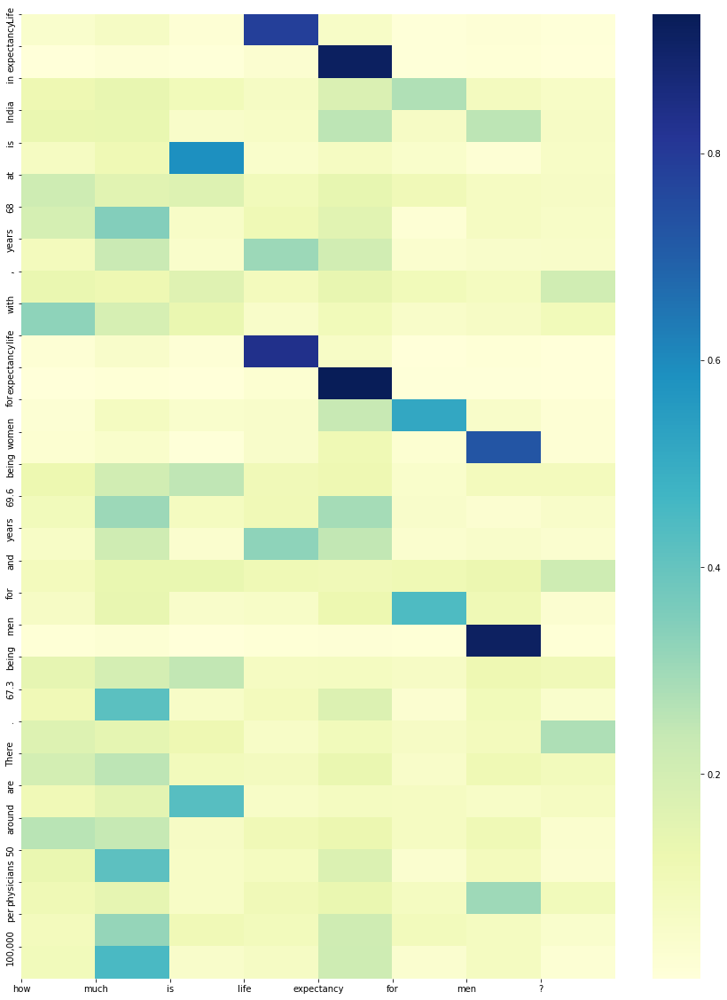

In [ ]:
start, end = result["best_span"]
question_tokens = result["question_tokens"]
passage_tokens = result["passage_tokens"]

attention = result["passage_question_attention"]

plt.figure(figsize=(15,20))
sns.heatmap(attention[:30], cmap="YlGnBu")
plt.autoscale(enable=True, axis='x')
plt.xticks(np.arange(len(question_tokens)), labels=question_tokens)
plt.yticks(np.arange(len(passage_tokens[:30])), labels=passage_tokens[:30])
plt.show()

## Attention values on different passage tokens

### Highest attention value tokens

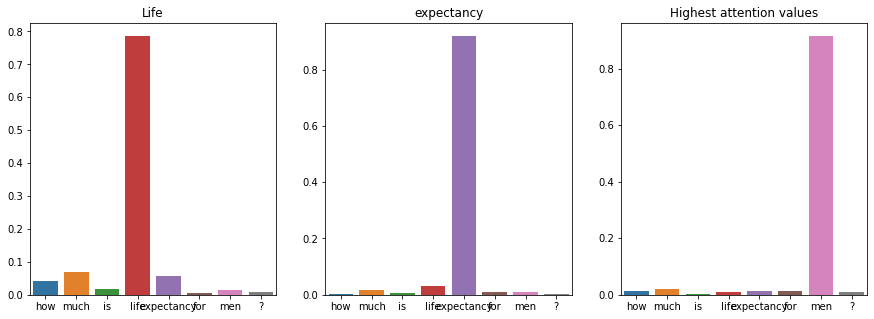

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
sns.barplot(question_tokens, attention[0], ax=axes[0])
sns.barplot(question_tokens, attention[1], ax=axes[1])
sns.barplot(question_tokens, attention[19], ax=axes[2])
axes[0].set_title(passage_tokens[0])
axes[1].set_title(passage_tokens[1])
axes[2].set_title(passage_tokens[19])
plt.show()

### Medium attention value tokens

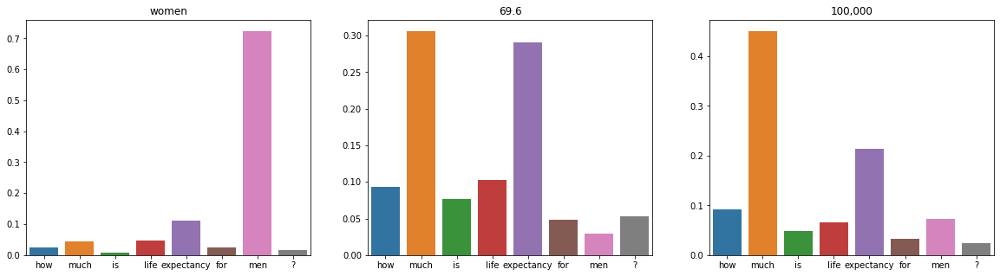

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
sns.barplot(question_tokens, attention[13], ax=axes[0])
sns.barplot(question_tokens, attention[15], ax=axes[1])
sns.barplot(question_tokens, attention[29], ax=axes[2])
axes[0].set_title(passage_tokens[13])
axes[1].set_title(passage_tokens[15])
axes[2].set_title(passage_tokens[29])
plt.show()

## Lowest attention value tokens

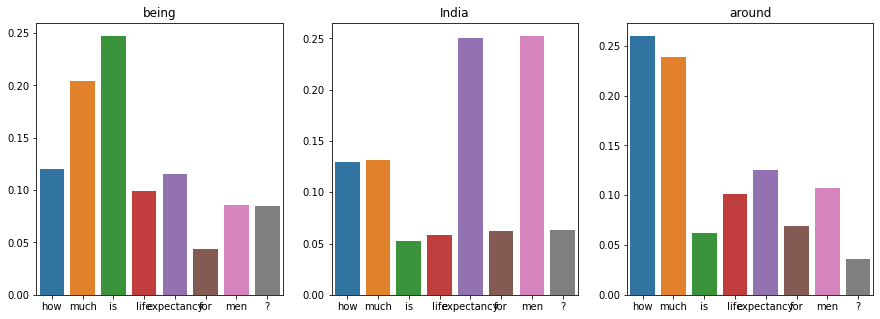

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
sns.barplot(question_tokens, attention[14], ax=axes[0])
sns.barplot(question_tokens, attention[3], ax=axes[1])
sns.barplot(question_tokens, attention[25], ax=axes[2])
axes[0].set_title(passage_tokens[14])
axes[1].set_title(passage_tokens[3])
axes[2].set_title(passage_tokens[25])
plt.show()

In [ ]:
import os
import zipfile
import shutil
import urllib.request
import logging
import lzma
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

!pip install -q transformers
!pip install -q git+https://github.com/huggingface/transformers

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
import tensorflow as tf
from transformers import AutoTokenizer, TFAutoModelForQuestionAnswering, TFBertForMaskedLM, TFBertForQuestionAnswering

def get_pretrained_squad_model(model_name):
  model, tokenizer = None, None
  if model_name == "distilbertsquad1":
      tokenizer = AutoTokenizer.from_pretrained("distilbert-base-cased-distilled-squad",use_fast=True)
      model = TFBertForQuestionAnswering.from_pretrained("distilbert-base-cased-distilled-squad", from_pt=True)
  elif model_name == "distilbertsquad2": 
      tokenizer = AutoTokenizer.from_pretrained("twmkn9/distilbert-base-uncased-squad2",use_fast=True)
      model = TFAutoModelForQuestionAnswering.from_pretrained("twmkn9/distilbert-base-uncased-squad2", from_pt=True)
  elif model_name == "bertsquad2": 
      tokenizer = AutoTokenizer.from_pretrained("deepset/bert-base-cased-squad2", use_fast=True)
      model = TFBertForQuestionAnswering.from_pretrained("deepset/bert-base-cased-squad2", from_pt=True)
  elif model_name == "bertlargesquad2": 
      tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased",use_fast=True)
      model = TFBertForQuestionAnswering.from_pretrained("deepset/bert-large-uncased-whole-word-masking-squad2", from_pt=True)
  elif model_name == "albertbasesquad2": 
      tokenizer = AutoTokenizer.from_pretrained("twmkn9/albert-base-v2-squad2",use_fast=True)
      model = TFBertForQuestionAnswering.from_pretrained("twmkn9/albert-base-v2-squad2", from_pt=True)
  elif model_name == "distilrobertasquad2": 
      tokenizer = AutoTokenizer.from_pretrained("twmkn9/distilroberta-base-squad2",use_fast=True)
      model = TFBertForQuestionAnswering.from_pretrained("twmkn9/distilroberta-base-squad2", from_pt=True)
  elif model_name == "robertasquad2": 
      tokenizer = AutoTokenizer.from_pretrained("deepset/roberta-base-squad2",use_fast=True)
      model = TFAutoModelForQuestionAnswering.from_pretrained("deepset/roberta-base-squad2", from_pt=True)
  elif model_name == "bertlm":
    tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased",use_fast=True)
    model = TFBertForMaskedLM.from_pretrained("bert-base-uncased", from_pt=True)

  return model, tokenizer

# Choose from any set of HuggingFace models to use!
bqa_model, bqa_tokenizer = get_pretrained_squad_model("bertsquad2")
# bqa_model, bqa_tokenizer = get_pretrained_squad_model("distilbertsquad2")
# bqa_model, bqa_tokenizer = get_pretrained_squad_model("robertasquad2")
# bqa_model, bqa_tokenizer = get_pretrained_squad_model("distilrobertasquad2")

In [ ]:
def get_answer_span(question, context, model, tokenizer): 
  inputs = tokenizer.encode_plus(question, context, return_tensors="tf", add_special_tokens=True, max_length=512) 
  answer_start_scores, answer_end_scores = model(inputs)  
  answer_start = tf.argmax(answer_start_scores, axis=1).numpy()[0] 
  answer_end = (tf.argmax(answer_end_scores, axis=1) + 1).numpy()[0]  
  print(tokenizer.convert_tokens_to_string(inputs["input_ids"][0][answer_start:answer_end]))
  return answer_start, answer_end

In [ ]:

def clean_tokens(gradients, tokens, token_types):
  """
  Clean the tokens and gradients gradients
  Remove "[CLS]","[CLR]", "[SEP]" tokens
  Reduce (mean) gradients values for tokens that are split ##
  """
  token_holder = []
  token_type_holder = []
  gradient_holder = [] 
  i = 0
  while i < len(tokens):
    if (tokens[i] not in ["[CLS]","[CLR]", "[SEP]"]):
      token = tokens[i]
      conn = gradients[i] 
      token_type = token_types[i]
      if i < len(tokens)-1 :
        if tokens[i+1][0:2] == "##":
          token = tokens[i]
          conn = gradients[i]  
          j = 1
          while i < len(tokens)-1 and tokens[i+1][0:2] == "##":
            i +=1 
            token += tokens[i][2:]
            conn += gradients[i]   
            j+=1
          conn = conn /j 
      token_holder.append(token)
      token_type_holder.append(token_type)
      gradient_holder.append(conn)
    i +=1
  return  gradient_holder,token_holder, token_type_holder

def get_best_start_end_position(start_scores, end_scores):
  answer_start = tf.argmax(start_scores, axis=1).numpy()[0] 
  answer_end = (tf.argmax(end_scores, axis=1) + 1).numpy()[0] 
  return answer_start, answer_end

def get_correct_span_mask(correct_index, token_size):
  span_mask = np.zeros((1, token_size))
  span_mask[0, correct_index] = 1
  span_mask = tf.constant(span_mask, dtype='float32')
  return span_mask
 
 
def get_embedding_matrix(model):
    if "DistilBert" in type(model).__name__:
        return model.distilbert.embeddings.word_embeddings
    else:
        return model.bert.embeddings.word_embeddings

def get_gradient(question, context, model, tokenizer): 
  """Return gradient of input (question) wrt to model output span prediction 

  Args:
      question (str): text of input question
      context (str): text of question context/passage
      model (QA model): Hugging Face BERT model for QA transformers.modeling_tf_distilbert.TFDistilBertForQuestionAnswering, transformers.modeling_tf_bert.TFBertForQuestionAnswering
      tokenizer (tokenizer): transformers.tokenization_bert.BertTokenizerFast 

  Returns:
        (tuple): (gradients, token_words, token_types, answer_text)
  """
  embedding_matrix = get_embedding_matrix(model)  
  encoded_tokens =  tokenizer.encode_plus(question, context, add_special_tokens=True, return_token_type_ids=True, return_tensors="tf")
  token_ids = list(encoded_tokens["input_ids"].numpy()[0])
  vocab_size = embedding_matrix.get_shape()[0]

  # convert token ids to one hot. We can't differentiate wrt to int token ids hence the need for one hot representation
  token_ids_tensor = tf.constant([token_ids], dtype='int32')
  token_ids_tensor_one_hot = tf.one_hot(token_ids_tensor, vocab_size) 
  
 
  with tf.GradientTape(watch_accessed_variables=False) as tape:
    # (i) watch input variable
    tape.watch(token_ids_tensor_one_hot)
 
    # multiply input model embedding matrix; allows us do backprop wrt one hot input 
    inputs_embeds = tf.matmul(token_ids_tensor_one_hot,embedding_matrix)  

    # (ii) get prediction
    start_scores,end_scores = model({"inputs_embeds": inputs_embeds, "token_type_ids": encoded_tokens["token_type_ids"], "attention_mask": encoded_tokens["attention_mask"] })
    answer_start, answer_end = get_best_start_end_position(start_scores, end_scores)

    start_output_mask = get_correct_span_mask(answer_start, len(token_ids))
    end_output_mask = get_correct_span_mask(answer_end, len(token_ids))
  
    # zero out all predictions outside of the correct span positions; we want to get gradients wrt to just these positions
    predict_correct_start_token = tf.reduce_sum(start_scores * start_output_mask)
    predict_correct_end_token = tf.reduce_sum(end_scores * end_output_mask) 

    # (iii) get gradient of input with respect to both start and end output
    gradient_non_normalized = tf.norm(
        tape.gradient([predict_correct_start_token, predict_correct_end_token], token_ids_tensor_one_hot),axis=2)
    
    # (iv) normalize gradient scores and return them as "explanations"
    gradient_tensor = (
        gradient_non_normalized /
        tf.reduce_max(gradient_non_normalized)
    )
    gradients = gradient_tensor[0].numpy().tolist()
    
    token_words = tokenizer.convert_ids_to_tokens(token_ids) 
    token_types = list(encoded_tokens["token_type_ids"].numpy()[0])
    answer_text = tokenizer.decode(token_ids[answer_start:answer_end])

    return  gradients,  token_words, token_types,answer_text


def explain_model(question, context, model, tokenizer, explain_method = "gradient"):
  if explain_method == "gradient":
    return get_gradient(question, context, model, tokenizer)


In [ ]:
def plot_gradients(tokens, token_types, gradients, title): 
  """ Plot  explanations
  """
  plt.figure(figsize=(21,3)) 
  xvals = [ x + str(i) for i,x in enumerate(tokens)]
  colors =  [ (0,0,1, c) for c,t in zip(gradients, token_types) ]
  edgecolors = [ "black" if t==0 else (0,0,1, c)  for c,t in zip(gradients, token_types) ]
  # colors =  [  ("r" if t==0 else "b")  for c,t in zip(gradients, token_types) ]
  plt.tick_params(axis='both', which='minor', labelsize=29)
  p = plt.bar(xvals, gradients, color=colors, linewidth=1, edgecolor=edgecolors)
  plt.title(title) 
  p=plt.xticks(ticks=[i for i in range(len(tokens))], labels=tokens, fontsize=12,rotation=90) 

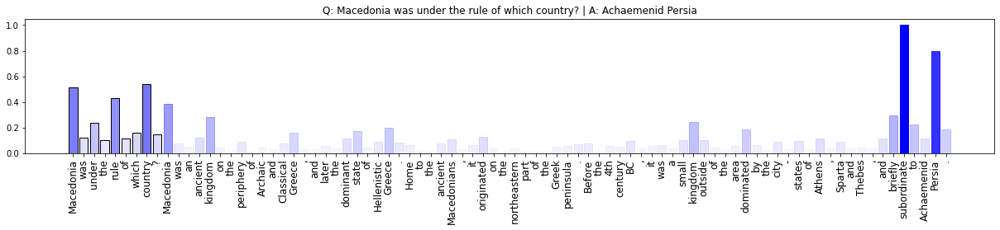

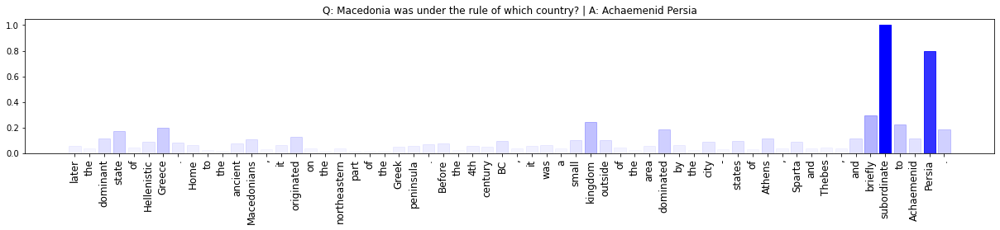

In [ ]:
question = "Macedonia was under the rule of which country?"
context = """Macedonia was an ancient kingdom on the periphery of Archaic and Classical Greece, 
and later the dominant state of Hellenistic Greece. Home to the ancient 
Macedonians, it originated on the northeastern part of the Greek peninsula. Before the 4th 
century BC, it was a small kingdom outside of the area dominated by the city-states of Athens, 
Sparta and Thebes, and briefly subordinate to Achaemenid Persia."""

gradients, tokens, token_types, answer  = explain_model(question, context, bqa_model, bqa_tokenizer)
gradients, tokens, token_types = clean_tokens(gradients, tokens, token_types)

token_subset = -60
plot_gradients(tokens, token_types, gradients, "Q: " +question + " | A: "+ answer)
plot_gradients(tokens[token_subset:], token_types[token_subset:], gradients[token_subset:], "Q: " +question + " | A: " + answer)


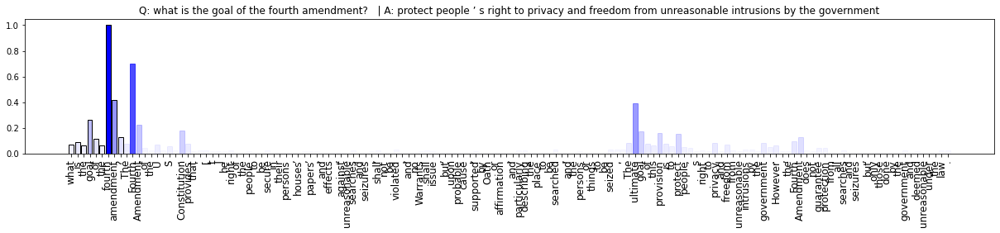

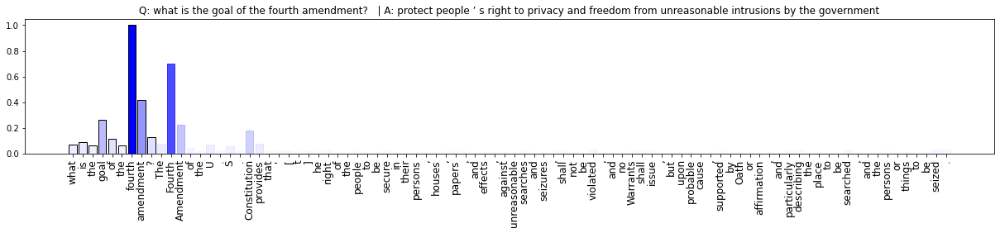

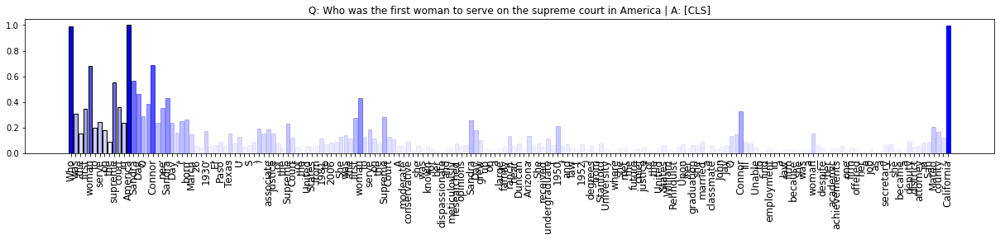

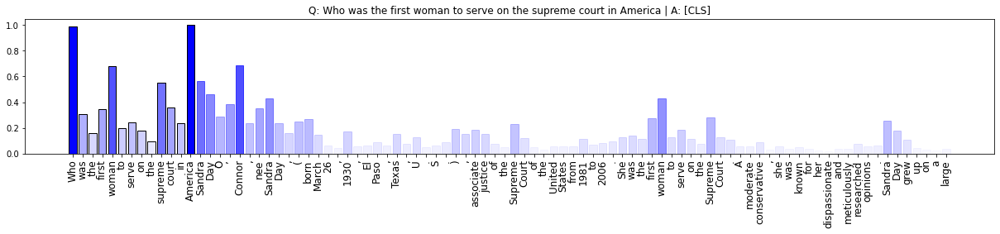

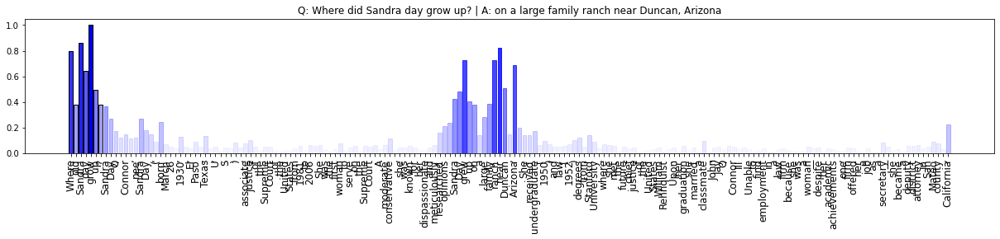

...

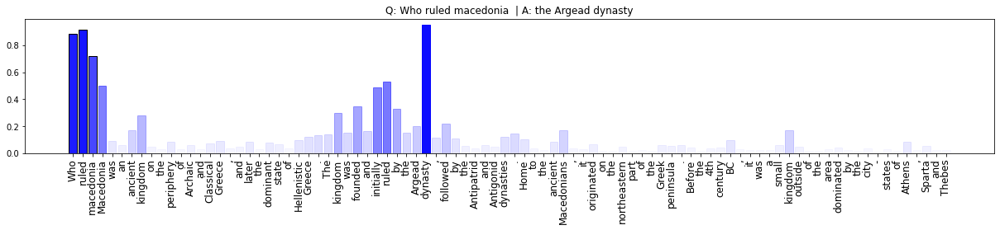

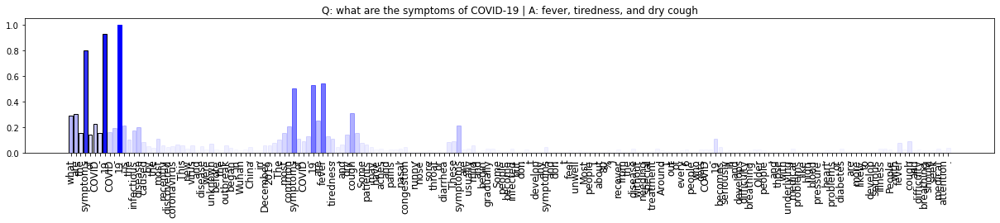

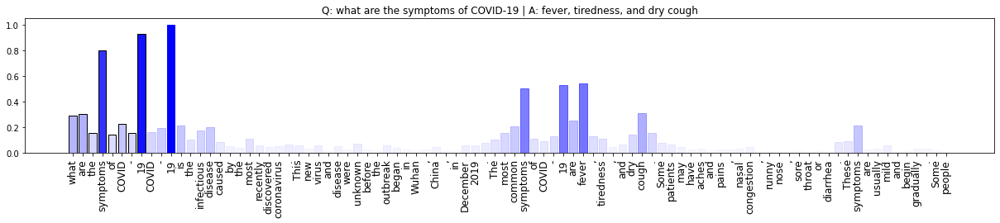

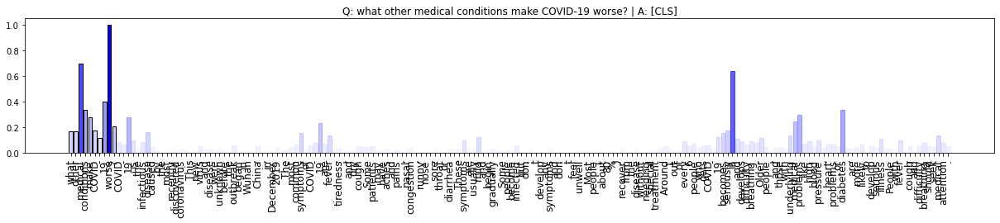

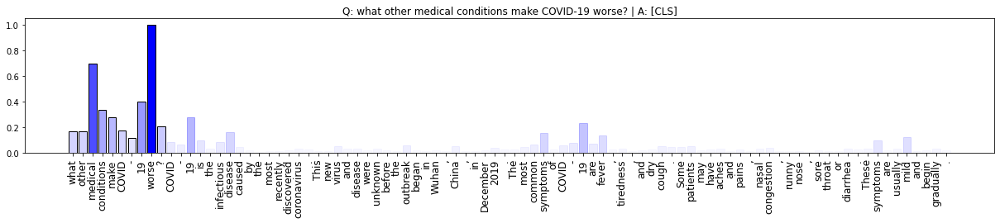

In [ ]:
questions = [
    { "question": "what is the goal of the fourth amendment?  ", "context": "The Fourth Amendment of the U.S. Constitution provides that '[t]he right of the people to be secure in their persons, houses, papers, and effects, against unreasonable searches and seizures, shall not be violated, and no Warrants shall issue, but upon probable cause, supported by Oath or affirmation, and particularly describing the place to be searched, and the persons or things to be seized.'The ultimate goal of this provision is to protect people’s right to privacy and freedom from unreasonable intrusions by the government. However, the Fourth Amendment does not guarantee protection from all searches and seizures, but only those done by the government and deemed unreasonable under the law." },
    { "question": "Who was the first woman to serve on the supreme court in America", "context": "Sandra Day O’Connor, née Sandra Day, (born March 26, 1930, El Paso, Texas, U.S.), associate justice of the Supreme Court of the United States from 1981 to 2006. She was the first woman to serve on the Supreme Court. A moderate conservative, she was known for her dispassionate and meticulously researched opinions. Sandra Day grew up on a large family ranch near Duncan, Arizona. She received undergraduate (1950) and law (1952) degrees from Stanford University, where she met the future chief justice of the United States William Rehnquist. Upon her graduation she married a classmate, John Jay O’Connor III. Unable to find employment in a law firm because she was a woman—despite her academic achievements, one firm offered her a job as a secretary—she became a deputy district attorney in San Mateo county, California" },
    { "question": "Where did Sandra day grow up?", "context": "Sandra Day O’Connor, née Sandra Day, (born March 26, 1930, El Paso, Texas, U.S.), associate justice of the Supreme Court of the United States from 1981 to 2006. She was the first woman to serve on the Supreme Court. A moderate conservative, she was known for her dispassionate and meticulously researched opinions. Sandra Day grew up on a large family ranch near Duncan, Arizona. She received undergraduate (1950) and law (1952) degrees from Stanford University, where she met the future chief justice of the United States William Rehnquist. Upon her graduation she married a classmate, John Jay O’Connor III. Unable to find employment in a law firm because she was a woman—despite her academic achievements, one firm offered her a job as a secretary—she became a deputy district attorney in San Mateo county, California" },
    { "question": "What school did Sandra day attend?", "context": "Sandra Day O’Connor, née Sandra Day, (born March 26, 1930, El Paso, Texas, U.S.), associate justice of the Supreme Court of the United States from 1981 to 2006. She was the first woman to serve on the Supreme Court. A moderate conservative, she was known for her dispassionate and meticulously researched opinions. Sandra Day grew up on a large family ranch near Duncan, Arizona. She received undergraduate (1950) and law (1952) degrees from Stanford University, where she met the future chief justice of the United States William Rehnquist. Upon her graduation she married a classmate, John Jay O’Connor III. Unable to find employment in a law firm because she was a woman—despite her academic achievements, one firm offered her a job as a secretary—she became a deputy district attorney in San Mateo county, California" },
    { "question": "what is the taj mahal made of?", "context": "The Taj Mahal is an ivory-white marble mausoleum on the southern bank of the river Yamuna in the Indian city of Agra. It was commissioned in 1632 by the Mughal emperor Shah Jahan (reigned from 1628 to 1658) to house the tomb of his favourite wife, Mumtaz Mahal; it also houses the tomb of Shah Jahan himself. The tomb is the centrepiece of a 17-hectare (42-acre) complex, which includes a mosque and a guest house, and is set in formal gardens bounded on three sides by a crenellated wall. Construction of the mausoleum was essentially completed in 1643, but work continued on other phases of the project for another 10 years. The Taj Mahal complex is believed to have been completed in its entirety in 1653 at a cost estimated at the time to be around 32 million rupees, which in 2020 would be approximately 70 billion rupees (about U.S. $916 million). The construction project employed some 20,000 artisans under the guidance of a board of architects led by the court architect to the emperor. The Taj Mahal was designated as a UNESCO World Heritage Site in 1983 for being the jewel of Muslim art in India and one of the universally admired masterpieces of the world's heritage. It is regarded by many as the best example of Mughal architecture and a symbol of India's rich history. The Taj Mahal attracts 7–8 million visitors a year and in 2007, it was declared a winner of the New 7 Wonders of the World (2000–2007) initiative." },
    { "question": "what was the cost for building the taj mahal?", "context": "The Taj Mahal is an ivory-white marble mausoleum on the southern bank of the river Yamuna in the Indian city of Agra. It was commissioned in 1632 by the Mughal emperor Shah Jahan (reigned from 1628 to 1658) to house the tomb of his favourite wife, Mumtaz Mahal; it also houses the tomb of Shah Jahan himself. The tomb is the centrepiece of a 17-hectare (42-acre) complex, which includes a mosque and a guest house, and is set in formal gardens bounded on three sides by a crenellated wall. Construction of the mausoleum was essentially completed in 1643, but work continued on other phases of the project for another 10 years. The Taj Mahal complex is believed to have been completed in its entirety in 1653 at a cost estimated at the time to be around 32 million rupees, which in 2020 would be approximately 70 billion rupees (about U.S. $916 million). The construction project employed some 20,000 artisans under the guidance of a board of architects led by the court architect to the emperor. The Taj Mahal was designated as a UNESCO World Heritage Site in 1983 for being the jewel of Muslim art in India and one of the universally admired masterpieces of the world's heritage. It is regarded by many as the best example of Mughal architecture and a symbol of India's rich history. The Taj Mahal attracts 7–8 million visitors a year and in 2007, it was declared a winner of the New 7 Wonders of the World (2000–2007) initiative." },
    { "question": "Who ruled macedonia ", "context": "Macedonia was an ancient kingdom on the periphery of Archaic and Classical Greece, and later the dominant state of Hellenistic Greece. The kingdom was founded and initially ruled by the Argead dynasty, followed by the Antipatrid and Antigonid dynasties. Home to the ancient Macedonians, it originated on the northeastern part of the Greek peninsula. Before the 4th century BC, it was a small kingdom outside of the area dominated by the city-states of Athens, Sparta and Thebes, and briefly subordinate to Achaemenid Persia" },
    { "question": "what are the symptoms of COVID-19", "context": "COVID-19 is the infectious disease caused by the most recently discovered coronavirus. This new virus and disease were unknown before the outbreak began in Wuhan, China, in December 2019. The most common symptoms of COVID-19 are fever, tiredness, and dry cough. Some patients may have aches and pains, nasal congestion, runny nose, sore throat or diarrhea. These symptoms are usually mild and begin gradually. Some people become infected but don’t develop any symptoms and don't feel unwell. Most people (about 80%) recover from the disease without needing special treatment. Around 1 out of every 6 people who gets COVID-19 becomes seriously ill and develops difficulty breathing. Older people, and those with underlying medical problems like high blood pressure, heart problems or diabetes, are more likely to develop serious illness. People with fever, cough and difficulty breathing should seek medical attention." },
    { "question": "what other medical conditions make COVID-19 worse?", "context": "COVID-19 is the infectious disease caused by the most recently discovered coronavirus. This new virus and disease were unknown before the outbreak began in Wuhan, China, in December 2019. The most common symptoms of COVID-19 are fever, tiredness, and dry cough. Some patients may have aches and pains, nasal congestion, runny nose, sore throat or diarrhea. These symptoms are usually mild and begin gradually. Some people become infected but don’t develop any symptoms and don't feel unwell. Most people (about 80%) recover from the disease without needing special treatment. Around 1 out of every 6 people who gets COVID-19 becomes seriously ill and develops difficulty breathing. Older people, and those with underlying medical problems like high blood pressure, heart problems or diabetes, are more likely to develop serious illness. People with fever, cough and difficulty breathing should seek medical attention." }
]

token_subset = 90
for row in questions:
  question, context = row["question"], row["context"]
  
  gradients, tokens, token_types, answer  = explain_model(question, context, bqa_model, bqa_tokenizer)
  gradients, tokens, token_types = clean_tokens(gradients, tokens, token_types) 
  plot_gradients(tokens, token_types, gradients, "Q: " +question + " | A: "+ answer)
  plot_gradients(tokens[:token_subset], token_types[:token_subset], gradients[:token_subset], "Q: " +question + " | A: " + answer)


In [ ]:
import time
import pandas as pd

model_names = ["distilbertsquad1","distilbertsquad2","bertsquad2","bertlargesquad2"]
result_holder = []
for model_name in model_names:
  bqa_model, bqa_tokenizer = get_pretrained_squad_model(model_name)
  for row in questions:
    start_time = time.time() 
    question, context = row["question"], row["context"] 
    gradients, tokens, token_types, answer  = explain_model(question, context, bqa_model, bqa_tokenizer) 
    elapsed_time = time.time() - start_time
    result_holder.append({"question": question,  "context":context, "answer": answer, "model": model_name, "runtime": elapsed_time})

result_df = pd.DataFrame(result_holder)

Downloading:   0%|          | 0.00/473 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/213k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/261M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/265M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/433 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/540 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

,question,answer_distilbertsquad1,answer_distilbertsquad2,answer_bertsquad2,answer_bertlargesquad2
0,what is the goal of the fourth amendment?,,to protect people ’ s right to privacy and fre...,protect people ’ s right to privacy and freedo...,to protect people ’ s right to privacy and fre...
1,Who was the first woman to serve on the suprem...,,sandra day o ’ connor,[CLS],sandra day o ’ connor
2,Where did Sandra day grow up?,,"duncan, arizona","on a large family ranch near Duncan, Arizona","duncan, arizona"
3,What school did Sandra day attend?,,stanford university,[CLS],stanford university
4,what is the taj mahal made of?,,ivory - white marble,ivory - white marble,ivory - white marble
5,what was the cost for building the taj mahal?,,32 million rupees,32 million rupees,32 million rupees
6,Who ruled macedonia,,argead dynasty,the Argead dynasty,the kingdom was founded and initially ruled by...
7,what are the symptoms of COVID-19,These symptoms are usually mild,"fever, tiredness, and dry cough","fever, tiredness, and dry cough","fever, tiredness, and dry cough"
8,what other medical conditions make COVID-19 wo...,##well. Most people ( about 80 % ) recover fro...,,[CLS],[CLS]


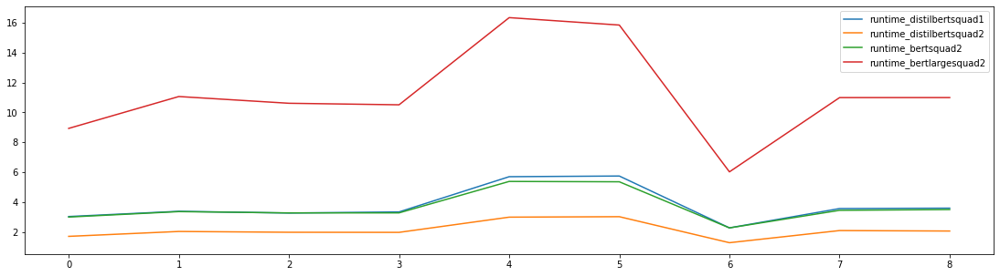

In [ ]:
question_df = result_df[result_df["model"] == "bertsquad2"].reset_index()[["question"]]
df_list = [question_df]
for model_name in model_names:
  sub_df = result_df[result_df["model"] == model_name].reset_index()[["answer", "runtime"]]
  sub_df.columns = [ (col_name + "_" + model_name)  for col_name in sub_df.columns]
  df_list.append(sub_df)
jdf = pd.concat(df_list, axis=1)
answer_cols = ["question"] + [col for col in jdf.columns if 'answer' in col] 
jdf.plot(kind="line", figsize=(19,5))
jdf[answer_cols]

In [ ]:
runtime_cols = [col for col in jdf.columns if 'runtime' in col] 
mean_runtime = jdf[runtime_cols].mean()
print("Mean runtime per model across 8 question/context pairs")
print(mean_runtime)

Mean runtime per model across 8 question/context pairs
runtime_distilbertsquad1     3.769610
runtime_distilbertsquad2     2.130528
runtime_bertsquad2           3.655514
runtime_bertlargesquad2     11.257608
dtype: float64
